In [1]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
from itertools import cycle, islice
import matplotlib.pyplot as plt
from pandas.plotting import parallel_coordinates
import seaborn as sns

%matplotlib inline

In [2]:
data = pd.read_csv('minute_weather.csv')
data

,rowID,hpwren_timestamp,air_pressure,air_temp,avg_wind_direction,avg_wind_speed,max_wind_direction,max_wind_speed,min_wind_direction,min_wind_speed,rain_accumulation,rain_duration,relative_humidity
0,0,2011-09-10 00:00:49,912.3,64.76,97.0,1.2,106.0,1.6,85.0,1.0,NaN,NaN,60.5
1,1,2011-09-10 00:01:49,912.3,63.86,161.0,0.8,215.0,1.5,43.0,0.2,0.0,0.0,39.9
2,2,2011-09-10 00:02:49,912.3,64.22,77.0,0.7,143.0,1.2,324.0,0.3,0.0,0.0,43.0
3,3,2011-09-10 00:03:49,912.3,64.40,89.0,1.2,112.0,1.6,12.0,0.7,0.0,0.0,49.5
4,4,2011-09-10 00:04:49,912.3,64.40,185.0,0.4,260.0,1.0,100.0,0.1,0.0,0.0,58.8
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1587252,1587252,2014-09-10 23:55:29,915.9,74.66,1.0,1.8,11.0,2.1,357.0,1.6,0.0,0.0,46.3
1587253,1587253,2014-09-10 23:56:29,915.9,74.66,9.0,1.6,19.0,1.8,353.0,1.4,0.0,0.0,46.2
1587254,1587254,2014-09-10 23:57:29,915.9,74.66,15.0,1.7,42.0,2.3,353.0,1.2,0.0,0.0,46.3
1587255,1587255,2014-09-10 23:58:29,915.9,74.66,8.0,1.8,24.0,2.2,355.0,1.4,0.0,0.0,46.2


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1587257 entries, 0 to 1587256
Data columns (total 13 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   rowID               1587257 non-null  int64  
 1   hpwren_timestamp    1587257 non-null  object 
 2   air_pressure        1587257 non-null  float64
 3   air_temp            1587257 non-null  float64
 4   avg_wind_direction  1586824 non-null  float64
 5   avg_wind_speed      1586824 non-null  float64
 6   max_wind_direction  1586824 non-null  float64
 7   max_wind_speed      1586824 non-null  float64
 8   min_wind_direction  1586824 non-null  float64
 9   min_wind_speed      1586824 non-null  float64
 10  rain_accumulation   1587256 non-null  float64
 11  rain_duration       1587256 non-null  float64
 12  relative_humidity   1587257 non-null  float64
dtypes: float64(11), int64(1), object(1)
memory usage: 157.4+ MB


In [4]:
data.isnull().sum()

rowID                   0
hpwren_timestamp        0
air_pressure            0
air_temp                0
avg_wind_direction    433
avg_wind_speed        433
max_wind_direction    433
max_wind_speed        433
min_wind_direction    433
min_wind_speed        433
rain_accumulation       1
rain_duration           1
relative_humidity       0
dtype: int64

In [5]:
df=data.dropna()

In [6]:
df.shape

(1586823, 13)

In [7]:
df['hpwren_timestamp'].unique()

array(['2011-09-10 00:01:49', '2011-09-10 00:02:49',
       '2011-09-10 00:03:49', ..., '2014-09-10 23:57:29',
       '2014-09-10 23:58:29', '2014-09-10 23:59:29'], dtype=object)

In [8]:
df.eq('').sum()

rowID                 0
hpwren_timestamp      0
air_pressure          0
air_temp              0
avg_wind_direction    0
avg_wind_speed        0
max_wind_direction    0
max_wind_speed        0
min_wind_direction    0
min_wind_speed        0
rain_accumulation     0
rain_duration         0
relative_humidity     0
dtype: int64

In [9]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
rowID,1586823.0,793614.029185,458204.542564,1.00,396794.5,793643.00,1190380.50,1587256.00
air_pressure,1586823.0,916.830248,3.051509,905.00,914.8,916.70,918.70,929.50
air_temp,1586823.0,61.855267,11.832718,31.64,52.7,62.24,70.88,99.50
avg_wind_direction,1586823.0,161.965420,95.208136,0.00,62.0,182.00,217.00,359.00
avg_wind_speed,1586823.0,2.774273,2.060758,0.00,1.3,2.20,3.80,32.30
max_wind_direction,1586823.0,163.403084,92.367252,0.00,68.0,187.00,223.00,359.00
max_wind_speed,1586823.0,3.399815,2.423168,0.10,1.6,2.70,4.60,36.00
min_wind_direction,1586823.0,166.826422,97.462755,0.00,77.0,180.00,212.00,359.00
min_wind_speed,1586823.0,2.133131,1.745345,0.00,0.8,1.60,3.00,32.00
rain_accumulation,1586823.0,0.001855,0.961103,0.00,0.0,0.00,0.00,655.01


In [10]:
df = df.drop(columns=['hpwren_timestamp'])

In [11]:
print(df[['rain_accumulation', 'rain_duration']].var())

rain_accumulation       0.923718
rain_duration        6586.728518
dtype: float64


In [12]:
print('Correlation of rain accumulation with other features:')
print(df.corr()['rain_accumulation'])
print()
print('Correlation of rain duration with other features:')
print(df.corr()['rain_duration'])

Correlation of rain accumulation with other features:
rowID                 0.001784
air_pressure         -0.000777
air_temp             -0.000609
avg_wind_direction    0.000061
avg_wind_speed        0.001759
max_wind_direction    0.000353
max_wind_speed        0.001728
min_wind_direction   -0.000339
min_wind_speed        0.001719
rain_accumulation     1.000000
rain_duration         0.927018
relative_humidity     0.000585
Name: rain_accumulation, dtype: float64

Correlation of rain duration with other features:
rowID                 0.000176
air_pressure         -0.006564
air_temp             -0.006268
avg_wind_direction    0.000898
avg_wind_speed        0.006652
max_wind_direction    0.001653
max_wind_speed        0.007033
min_wind_direction   -0.000453
min_wind_speed        0.005801
rain_accumulation     0.927018
rain_duration         1.000000
relative_humidity     0.006934
Name: rain_duration, dtype: float64


In [13]:
df.corr()

,rowID,air_pressure,air_temp,avg_wind_direction,avg_wind_speed,max_wind_direction,max_wind_speed,min_wind_direction,min_wind_speed,rain_accumulation,rain_duration,relative_humidity
rowID,1.000000,-0.055047,0.161816,0.033909,-0.033652,0.040278,-0.036822,0.027520,-0.031185,0.001784,0.000176,-0.027936
air_pressure,-0.055047,1.000000,0.046569,-0.195164,-0.079955,-0.218720,-0.062462,-0.139135,-0.098004,-0.000777,-0.006564,-0.375846
air_temp,0.161816,0.046569,1.000000,-0.016620,-0.208988,-0.046383,-0.208483,0.033343,-0.200032,-0.000609,-0.006268,-0.620059
avg_wind_direction,0.033909,-0.195164,-0.016620,1.000000,-0.031116,0.716316,-0.030637,0.622763,-0.035435,0.000061,0.000898,0.205829
avg_wind_speed,-0.033652,-0.079955,-0.208988,-0.031116,1.000000,0.017618,0.985009,-0.117808,0.970987,0.001759,0.006652,0.061139
max_wind_direction,0.040278,-0.218720,-0.046383,0.716316,0.017618,1.000000,0.017503,0.421683,0.010340,0.000353,0.001653,0.241055
max_wind_speed,-0.036822,-0.062462,-0.208483,-0.030637,0.985009,0.017503,1.000000,-0.112538,0.925881,0.001728,0.007033,0.048773
min_wind_direction,0.027520,-0.139135,0.033343,0.622763,-0.117808,0.421683,-0.112538,1.000000,-0.121161,-0.000339,-0.000453,0.129133
min_wind_speed,-0.031185,-0.098004,-0.200032,-0.035435,0.970987,0.010340,0.925881,-0.121161,1.000000,0.001719,0.005801,0.072227
rain_accumulation,0.001784,-0.000777,-0.000609,0.000061,0.001759,0.000353,0.001728,-0.000339,0.001719,1.000000,0.927018,0.000585


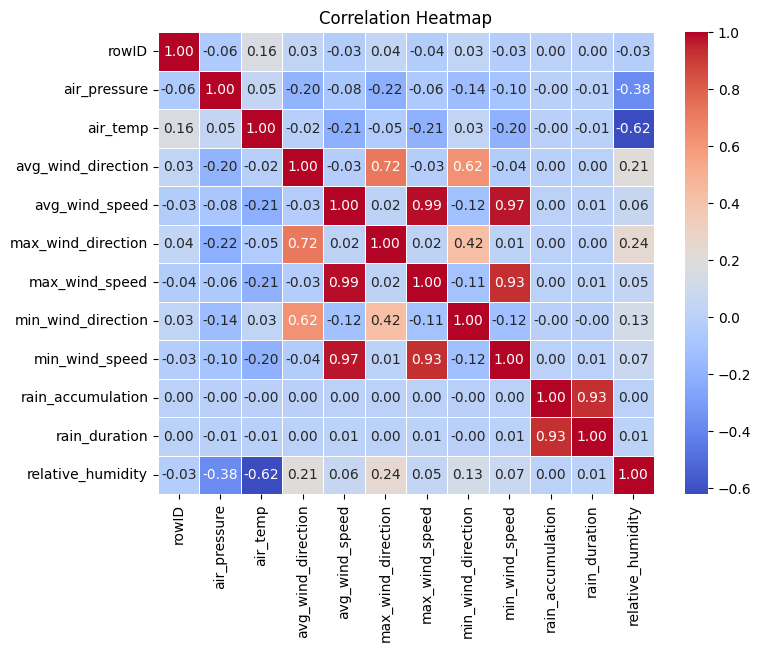

In [14]:
# Compute correlation matrix
corr_matrix = df.corr()

# Plot the heatmap
plt.figure(figsize=(8,6))  # Set figure size
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)

# Add title
plt.title("Correlation Heatmap")

# Show the heatmap
plt.show()


Below is a **step-by-step** way to decide which features to include in your `X` (the feature set for clustering). The main considerations are:

1. **Avoid using purely index-like or ID columns** (e.g., `rowID`) because they do not carry meaningful information for clustering.  

2. **Avoid or reduce highly correlated features** (since they provide redundant information).  

3. **Drop irrelevant features** that are not central to the clustering goal (e.g., `rain_accumulation` and `rain_duration` if you’re not focusing on precipitation).

---

## 1. Observations from the Heatmap

- **`rowID`** is just an index, so it’s not useful as a feature.

- **`rain_accumulation` and `rain_duration`** appear to have little correlation with the other main weather features and are highly correlated with each other (redundant).  

- **Wind features**  


  - `avg_wind_speed` is **highly correlated** with `max_wind_speed` (0.99) and `min_wind_speed` (0.97).  

    - Keeping all three would be redundant; **pick just one** to represent wind speed.  


  - `avg_wind_direction` is moderately correlated with `max_wind_direction` (0.72) and less with `min_wind_direction` (0.62).  

 
    - You can **pick just `avg_wind_direction`** to represent wind direction.  

- **`air_temp`, `air_pressure`, and `relative_humidity`**  


  - `air_temp` is moderately negatively correlated with `relative_humidity` (-0.62) and weakly correlated with `air_pressure` (-0.20).  


  - These three are still good distinct features to include since none are near ±1 correlation with each other.

---

## 2. Recommended Feature Subset

A common choice for **clustering on weather data** would be:

1. **`air_temp`** – Temperature is fundamental for weather characterization.  
2. **`air_pressure`** – Pressure is another key weather variable.  
3. **`relative_humidity`** – Captures moisture in the air.  
4. **`avg_wind_speed`** – A single, representative wind speed feature.  
5. **`avg_wind_direction`** – A single, representative wind direction feature.

You would **drop**:
- **`rowID`** – Not a meaningful feature for clustering.  
- **`rain_accumulation` and `rain_duration`** – Possibly dropped if not focusing on precipitation (or keep one if needed).  
- **`max_wind_speed`, `min_wind_speed`** – Redundant due to high correlation with `avg_wind_speed`.  
- **`max_wind_direction`, `min_wind_direction`** – Redundant due to correlation with `avg_wind_direction`.

---

## 3. Why These Features?
- **Low redundancy**: You avoid features that are strongly correlated.  
- **Relevance to weather**: Temperature, pressure, humidity, and wind are core meteorological variables.  
- **Simplicity**: Using fewer features reduces noise and can improve the performance of K-Means or other clustering algorithms.

---

### **Next Steps** 
1. **Scale your features** before clustering (e.g., using `StandardScaler` or `MinMaxScaler`), because K-Means is sensitive to feature magnitude.  
2. **Experiment** by adding or removing features to see how it affects the clusters (especially if precipitation is of interest).  

This balanced approach should give you **distinct, interpretable clusters** in your weather dataset.

In [42]:
from pandas_profiling import ProfileReport

profile = ProfileReport(df, explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
df_new = df[['air_pressure', 'air_temp', 'relative_humidity','avg_wind_direction', 'avg_wind_speed'] ]

In [16]:
df_new

,air_pressure,air_temp,relative_humidity,avg_wind_direction,avg_wind_speed
1,912.3,63.86,39.9,161.0,0.8
2,912.3,64.22,43.0,77.0,0.7
3,912.3,64.40,49.5,89.0,1.2
4,912.3,64.40,58.8,185.0,0.4
5,912.3,63.50,62.6,76.0,2.5
...,...,...,...,...,...
1587252,915.9,74.66,46.3,1.0,1.8
1587253,915.9,74.66,46.2,9.0,1.6
1587254,915.9,74.66,46.3,15.0,1.7
1587255,915.9,74.66,46.2,8.0,1.8


In [17]:
scaler=StandardScaler()

In [18]:
X = scaler.fit_transform(df_new)
X

array([[-1.4845933 ,  0.16942291, -0.29367037, -0.01014011, -0.95803273],
       [-1.4845933 ,  0.19984704, -0.1753875 , -0.89241793, -1.00655858],
       [-1.4845933 ,  0.2150591 ,  0.07262495, -0.76637824, -0.76392934],
       ...,
       [-0.30484867,  1.0821467 , -0.04947349, -1.54362298, -0.52130011],
       [-0.30484867,  1.0821467 , -0.05328907, -1.61714614, -0.47277426],
       [-0.30484867,  1.0821467 , -0.04947349, -1.57513291, -0.42424841]])

In [20]:
kmeans = KMeans(n_clusters=6)
model = kmeans.fit(X)
print("model\n", model)

model
 KMeans(n_clusters=6)


In [21]:
centers = model.cluster_centers_
centers

array([[-0.66768688,  0.23351365,  0.10269517,  0.36481542,  0.79577569],
       [-1.25688774, -1.3326553 ,  1.44412266,  0.37051749,  1.1055892 ],
       [ 0.15776501,  0.79319984, -0.63283729,  0.86913504, -0.49923384],
       [ 0.12794277, -0.99021989,  1.13388539,  0.19493513, -0.46589075],
       [ 1.44738252, -0.24242432, -1.06164327, -1.06284889,  1.05151066],
       [ 0.00669972,  0.56802476, -0.5387417 , -1.19903792, -0.60416396]])

In [22]:
print("Cluster Centers:\n", model.cluster_centers_)

Cluster Centers:
 [[-0.66768688  0.23351365  0.10269517  0.36481542  0.79577569]
 [-1.25688774 -1.3326553   1.44412266  0.37051749  1.1055892 ]
 [ 0.15776501  0.79319984 -0.63283729  0.86913504 -0.49923384]
 [ 0.12794277 -0.99021989  1.13388539  0.19493513 -0.46589075]
 [ 1.44738252 -0.24242432 -1.06164327 -1.06284889  1.05151066]
 [ 0.00669972  0.56802476 -0.5387417  -1.19903792 -0.60416396]]


In [23]:
df_new['Cluster'] = model.labels_


C:\Users\kumar\AppData\Local\Temp\ipykernel_30404\2398100725.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['Cluster'] = model.labels_


In [24]:
df_new.sample(10)  # Check the first few rows with assigned clusters

,air_pressure,air_temp,relative_humidity,avg_wind_direction,avg_wind_speed,Cluster
1095994,910.0,63.32,38.9,179.0,2.1,0
579857,917.2,79.16,27.8,210.0,5.7,0
1296960,917.1,65.30,14.7,185.0,2.8,2
919734,917.2,61.52,62.0,223.0,2.8,0
69605,918.2,72.68,19.1,317.0,1.3,2
1377158,914.0,49.46,90.3,213.0,2.9,1
524276,917.2,80.42,34.0,45.0,2.1,5
1364423,919.8,72.50,15.7,20.0,1.3,5
749704,918.6,67.46,10.0,62.0,2.1,5
142581,919.3,43.52,83.3,230.0,1.1,3


In [25]:
df_new['Cluster'].unique()

array([5, 0, 3, 2, 1, 4], dtype=int32)

In [26]:
print("Inertia (Lower is better):", model.inertia_)

Inertia (Lower is better): 3336104.996906781


In [27]:
np.bincount(model.labels_)

array([249666, 143501, 395689, 319631, 167588, 310748])

In [28]:
np.unique(model.labels_, return_counts=True)

(array([0, 1, 2, 3, 4, 5], dtype=int32),
 array([249666, 143501, 395689, 319631, 167588, 310748]))

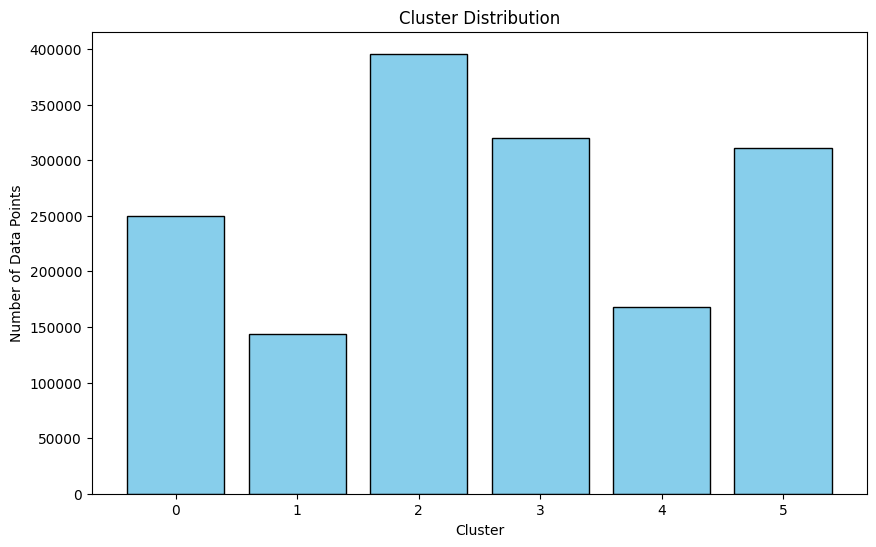

In [29]:
# Get unique cluster labels and their counts
labels, counts = np.unique(model.labels_, return_counts=True)

plt.figure(figsize=(10, 6))
plt.bar(labels, counts, color='skyblue', edgecolor='black')
plt.xlabel("Cluster")
plt.ylabel("Number of Data Points")
plt.title("Cluster Distribution")
plt.xticks(labels)  # Ensure all cluster labels are shown
plt.show()


In [30]:
import pandas as pd

centroids = pd.DataFrame(model.cluster_centers_, columns=['air_temp', 'air_pressure', 'relative_humidity', 'avg_wind_speed', 'avg_wind_direction'])
centroids.index.name = 'Cluster'
centroids


,air_temp,air_pressure,relative_humidity,avg_wind_speed,avg_wind_direction
Cluster,,,,,
0,-0.667687,0.233514,0.102695,0.364815,0.795776
1,-1.256888,-1.332655,1.444123,0.370517,1.105589
2,0.157765,0.793200,-0.632837,0.869135,-0.499234
3,0.127943,-0.990220,1.133885,0.194935,-0.465891
4,1.447383,-0.242424,-1.061643,-1.062849,1.051511
5,0.006700,0.568025,-0.538742,-1.199038,-0.604164


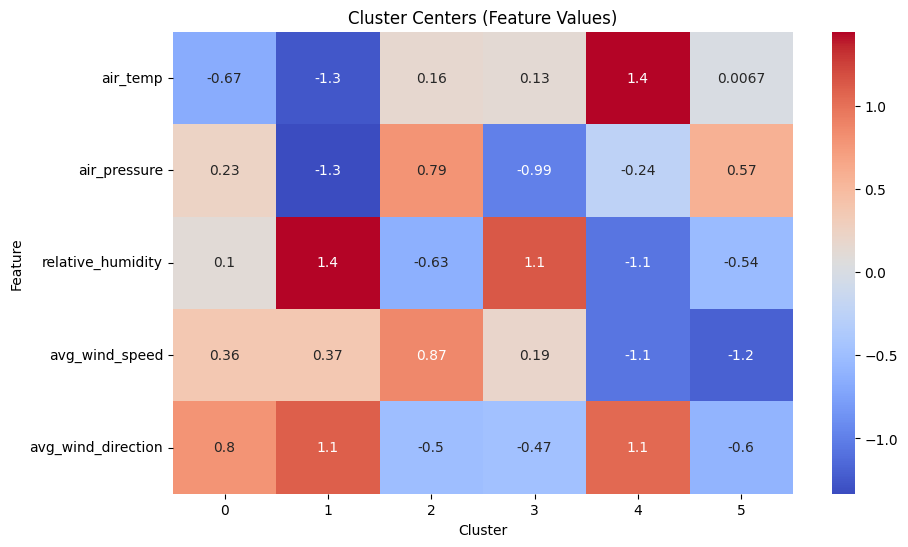

In [31]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.heatmap(centroids.T, cmap="coolwarm", annot=True)
plt.title("Cluster Centers (Feature Values)")
plt.xlabel("Cluster")
plt.ylabel("Feature")
plt.show()

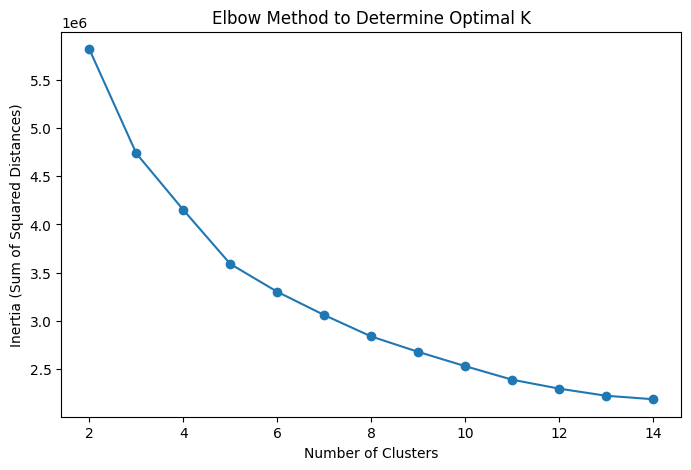

In [32]:
inertia = []
cluster_range = range(2, 15)

for k in cluster_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(cluster_range, inertia, marker='o', linestyle='-')
plt.xlabel("Number of Clusters")
plt.ylabel("Inertia (Sum of Squared Distances)")
plt.title("Elbow Method to Determine Optimal K")
plt.show()


In [33]:
unique, counts = np.unique(model.labels_, return_counts=True)

In [34]:
dict(zip(unique, counts))

{np.int32(0): np.int64(249666),
 np.int32(1): np.int64(143501),
 np.int32(2): np.int64(395689),
 np.int32(3): np.int64(319631),
 np.int32(4): np.int64(167588),
 np.int32(5): np.int64(310748)}

In [35]:
model.predict([[912.3 , 63.86 ,39.9, 161.0,	0.8]])

array([4], dtype=int32)

In [37]:
# Get cluster centers from K-Means (scaled values)
cluster_centers_scaled = kmeans.cluster_centers_

# Convert back to original scale
cluster_centers_original = scaler.inverse_transform(cluster_centers_scaled)

print("Cluster Centers in Original Scale:\n", cluster_centers_original)

Cluster Centers in Original Scale:
 [[918.95647579  50.93953042  70.85709497 250.36807376   1.93241812]
 [914.38505199  58.71152438  55.71325971 202.37318956   5.79678336]
 [917.89441665  56.8877371   33.79465313  56.95926465   1.90521044]
 [917.30531571  71.73640889  27.04663263 319.78354982   1.48170658]
 [914.61003401  47.24997462  86.0307236  201.97859273   2.69263282]
 [915.06588922  72.41608659  37.29711718  42.29893709   1.50592378]
 [917.40393996  72.29047697  28.57260813 194.78828657   1.51323193]
 [920.46963219  58.45086732  17.42440733  53.41599206   7.24494904]
 [917.419474    50.82329869  77.35559152  53.9398172    1.52264724]
 [918.61904085  73.33145675  21.02565715  38.08393649   1.86526966]
 [912.1454665   45.06038295  87.58024151 198.72123865   6.67325443]
 [922.46765426  59.24606525  21.24503721  76.30558672   2.71530395]
 [916.68345302  73.09468639  40.23352423 202.71989668   4.09962731]
 [914.34850204  63.89783559  53.1227194  184.72753064   1.91805197]]
